<a href="https://colab.research.google.com/github/ziatdinovmax/atomai/blob/master/examples/notebooks/atomai_rVAE_digits.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Variational autoencoders and their extensions

Notebook prepared by Maxim Ziatdinov 

Email: ziatdinovmax@gmail.com


---

This notebook demonstrates application of different variational autoencoders (VAEs) to rotated images. Specifically, we discuss rotationally invariant version of VAE (rVAE) and class-conditioned rVAE. 

---



Install AtomAI:

In [ ]:
!pip install atomai

  Cloning https://github.com/ziatdinovmax/atomai (to revision maxdev) to /tmp/pip-req-build-itmrbe2j
  Running command git clone -q https://github.com/ziatdinovmax/atomai /tmp/pip-req-build-itmrbe2j
  Running command git checkout -b maxdev --track origin/maxdev
  Switched to a new branch 'maxdev'
  Branch 'maxdev' set up to track remote branch 'maxdev' from 'origin'.
     |████████████████████████████████| 194kB 14.1MB/s 
     |████████████████████████████████| 870kB 24.5MB/s 
  Created wheel for atomai: filename=atomai-0.6.0-cp36-none-any.whl size=108790 sha256=5b202a1e60319574a504021cab68072a364482e91c7ef17e9949053507d73cfc
  Stored in directory: /tmp/pip-ephem-wheel-cache-xmabekl7/wheels/bb/c7/8c/0efd34c28b875a0e451edabea2abdcbf8227c4966f6e17bd9d
  Created wheel for mendeleev: filename=mendeleev-0.6.1-py2.py3-none-any.whl size=174964 sha256=1ffb247480047324154a342a6872be5736d84f7c25eb2229c136a5e8ce507a48
  Stored in directory: /root/.cache/pip/wheels/fb/28/5d/95e69a718b35dd00169889b

Imports:

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from torchvision import datasets
from PIL import Image
import atomai as aoi

(Down)load MNIST:

In [ ]:
mnist_trainset = datasets.MNIST(root='./data', train=True, download=True, transform=None)

In [ ]:
imstack_train_o = mnist_trainset.train_data.numpy()
labels_train = mnist_trainset.train_labels.numpy()

Apply arbitrary rotations:

In [ ]:
imstack_train = np.zeros_like(imstack_train_o)

for i, digit in enumerate(imstack_train_o):
    im = Image.fromarray(digit)
    im = im.rotate(np.random.randint(-90, 90), resample=Image.BICUBIC)
    imstack_train[i] = im

imstack_train = imstack_train / imstack_train.max()

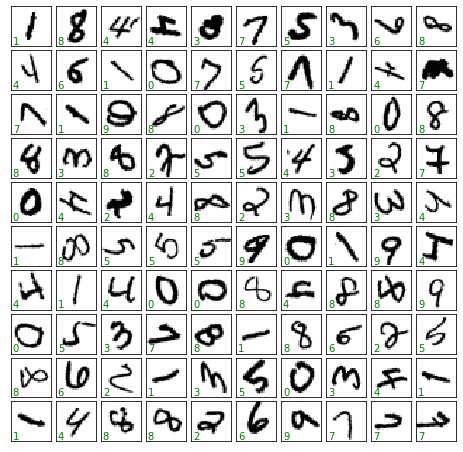

In [ ]:
fig, axes = plt.subplots(10, 10, figsize=(8, 8),
                         subplot_kw={'xticks':[], 'yticks':[]},
                         gridspec_kw=dict(hspace=0.1, wspace=0.1))

for ax in axes.flat:
    i = np.random.randint(len(imstack_train))
    ax.imshow(imstack_train[i], cmap='binary', interpolation='nearest')
    ax.text(0.05, 0.05, str(labels_train[i]),
            transform=ax.transAxes, color='green')

We first apply regular VAE to the rotated digits. The result of VAE on the non-rotated MNIST data can be found [elsewhere](https://keras.io/examples/generative/vae/).

In [ ]:
input_dim = (28, 28)

# Intitialize model
vae = aoi.models.VAE(input_dim) 
# Train
vae.fit(imstack_train, training_cycles=100, batch_size=100)

Epoch: 1/100, Training loss: 28.7448
Epoch: 2/100, Training loss: 26.1906
Epoch: 3/100, Training loss: 26.0338
Epoch: 4/100, Training loss: 25.9374
Epoch: 5/100, Training loss: 25.5878
Epoch: 6/100, Training loss: 25.1481
Epoch: 7/100, Training loss: 25.0335
Epoch: 8/100, Training loss: 24.9151
Epoch: 9/100, Training loss: 24.8297
Epoch: 10/100, Training loss: 24.7499
Epoch: 11/100, Training loss: 24.6995
Epoch: 12/100, Training loss: 24.6393
Epoch: 13/100, Training loss: 24.5835
Epoch: 14/100, Training loss: 24.5244
Epoch: 15/100, Training loss: 24.4862
Epoch: 16/100, Training loss: 24.4285
Epoch: 17/100, Training loss: 24.3916
Epoch: 18/100, Training loss: 24.3472
Epoch: 19/100, Training loss: 24.2802
Epoch: 20/100, Training loss: 24.2386
Epoch: 21/100, Training loss: 24.2077
Epoch: 22/100, Training loss: 24.1714
Epoch: 23/100, Training loss: 24.1431
Epoch: 24/100, Training loss: 24.1190
Epoch: 25/100, Training loss: 24.0962
Epoch: 26/100, Training loss: 24.0692
Epoch: 27/100, Traini

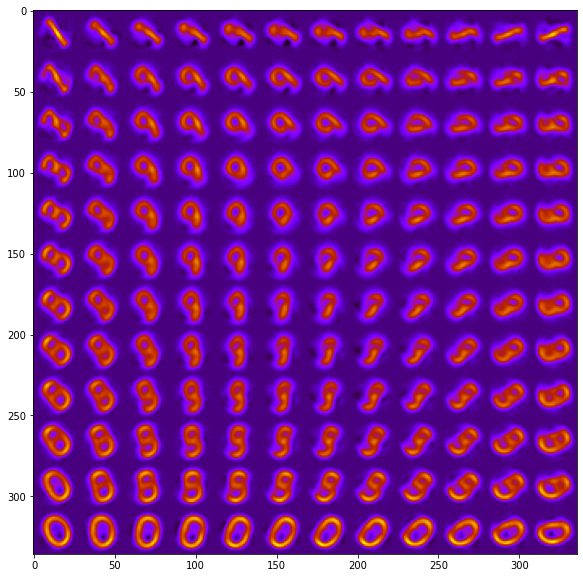

In [ ]:
vae.manifold2d(d=12, origin='upper')

Looks like it didn't do a very good job. To tackle this problem and analyze the general imaging data, here we utilize the rotationally
invariant extension of VAE (rVAE). The rVAE is based on the concept of [spatial decoder](https://arxiv.org/abs/1909.11663) introduced by Bepler *et al.* and represents a special class of VAEs where three of the latent variables are rotation and x- and y-offsets, complemented by classical latent variables associated with image content. Thus, rVAE adds rotational and (in this case) offset invariance to the analysis workflow. In other words, it is expected to recognize the images even if they are shifted and rotated with respect to each other.

Initialize and train rVAE model:

In [ ]:
input_dim = (28, 28)

# Intitialize model
rvae = aoi.models.rVAE(input_dim) 
# Train
rvae.fit(imstack_train, rotation_prior=np.pi/4, training_cycles=100, batch_size=100)

Epoch: 1/100, Training loss: 31.1315
Epoch: 2/100, Training loss: 28.4721
Epoch: 3/100, Training loss: 27.9316
Epoch: 4/100, Training loss: 27.6705
Epoch: 5/100, Training loss: 27.3984
Epoch: 6/100, Training loss: 27.1671
Epoch: 7/100, Training loss: 26.9998
Epoch: 8/100, Training loss: 26.8592
Epoch: 9/100, Training loss: 26.7374
Epoch: 10/100, Training loss: 26.6001
Epoch: 11/100, Training loss: 26.4329
Epoch: 12/100, Training loss: 26.2088
Epoch: 13/100, Training loss: 25.9547
Epoch: 14/100, Training loss: 25.6930
Epoch: 15/100, Training loss: 25.5069
Epoch: 16/100, Training loss: 25.3267
Epoch: 17/100, Training loss: 25.1878
Epoch: 18/100, Training loss: 25.0637
Epoch: 19/100, Training loss: 24.9190
Epoch: 20/100, Training loss: 24.7953
Epoch: 21/100, Training loss: 24.7009
Epoch: 22/100, Training loss: 24.5951
Epoch: 23/100, Training loss: 24.5120
Epoch: 24/100, Training loss: 24.4240
Epoch: 25/100, Training loss: 24.3425
Epoch: 26/100, Training loss: 24.2918
Epoch: 27/100, Traini

View results:

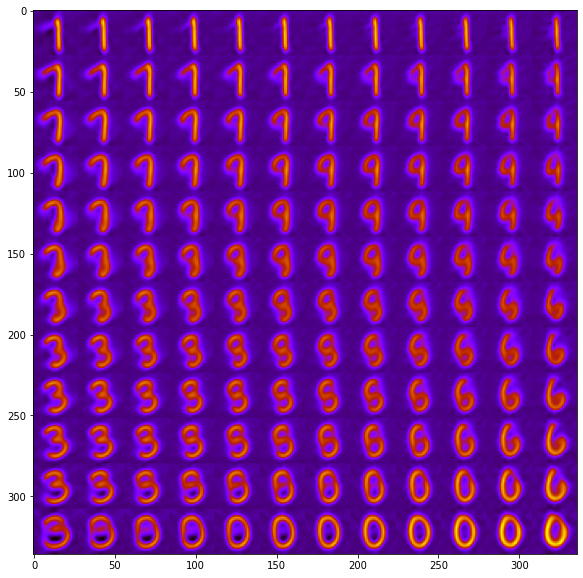

In [ ]:
rvae.manifold2d(d=12, origin='upper')

Looks much better! Now let's train a class-conditioned rVAE.

In [ ]:
input_dim = (28, 28)

# Intitialize model
rvae = aoi.models.rVAE(input_dim, nb_classes=10) 
# Train
rvae.fit(imstack_train, labels_train, rotation_prior=np.pi/2, training_cycles=100, batch_size=100)

Epoch: 1/100, Training loss: 30.2596
Epoch: 2/100, Training loss: 28.1132
Epoch: 3/100, Training loss: 27.7964
Epoch: 4/100, Training loss: 27.6411
Epoch: 5/100, Training loss: 27.4756
Epoch: 6/100, Training loss: 27.2976
Epoch: 7/100, Training loss: 27.1476
Epoch: 8/100, Training loss: 27.0239
Epoch: 9/100, Training loss: 26.8973
Epoch: 10/100, Training loss: 26.7330
Epoch: 11/100, Training loss: 26.4305
Epoch: 12/100, Training loss: 25.9965
Epoch: 13/100, Training loss: 25.5923
Epoch: 14/100, Training loss: 25.1755
Epoch: 15/100, Training loss: 24.8218
Epoch: 16/100, Training loss: 24.4590
Epoch: 17/100, Training loss: 24.1645
Epoch: 18/100, Training loss: 23.9025
Epoch: 19/100, Training loss: 23.6418
Epoch: 20/100, Training loss: 23.3954
Epoch: 21/100, Training loss: 23.1832
Epoch: 22/100, Training loss: 22.9287
Epoch: 23/100, Training loss: 22.7238
Epoch: 24/100, Training loss: 22.5527
Epoch: 25/100, Training loss: 22.3870
Epoch: 26/100, Training loss: 22.2410
Epoch: 27/100, Traini

View results:

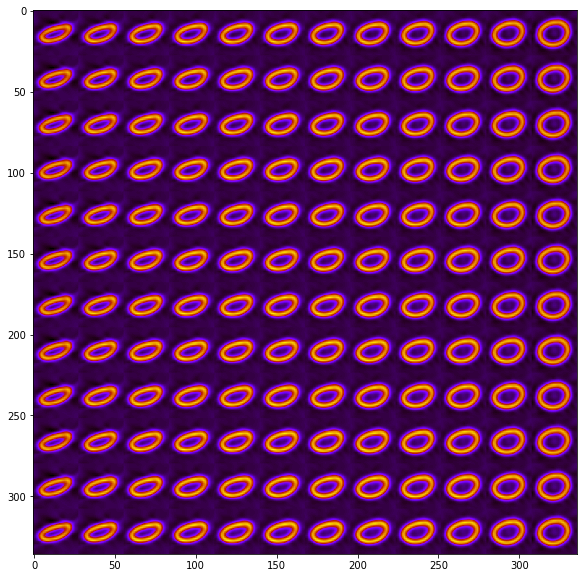

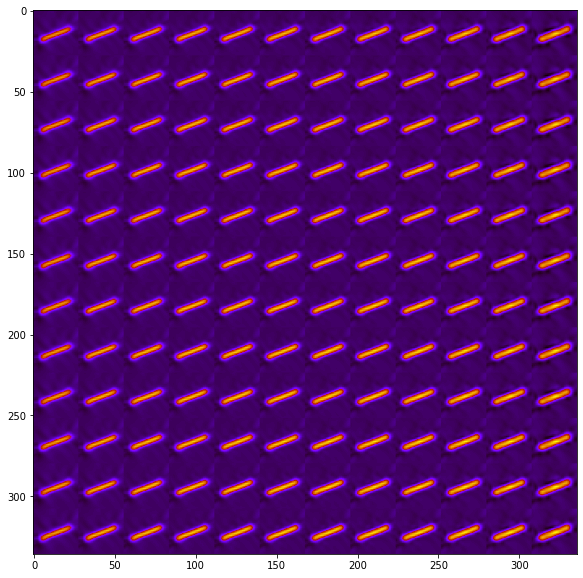

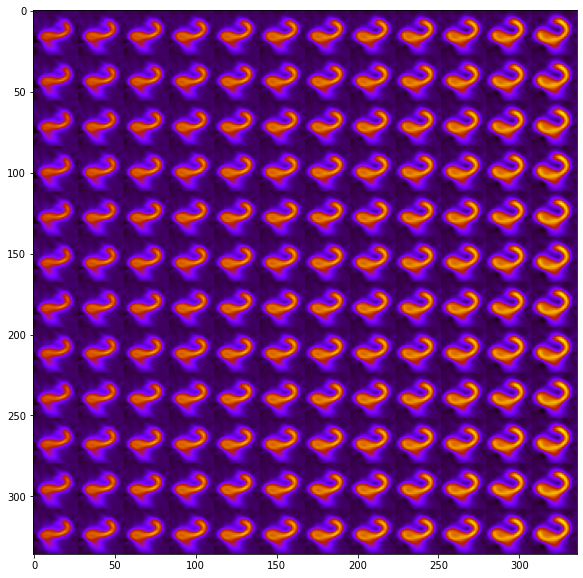

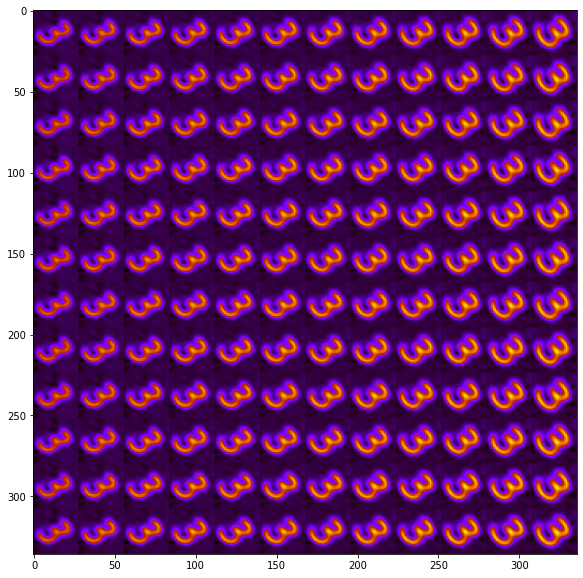

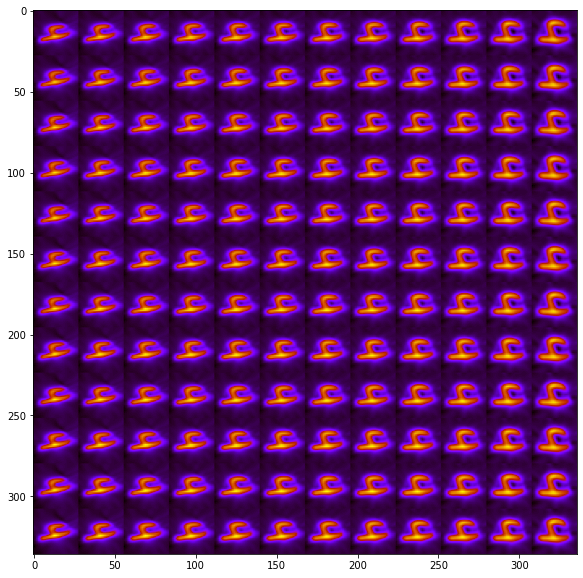

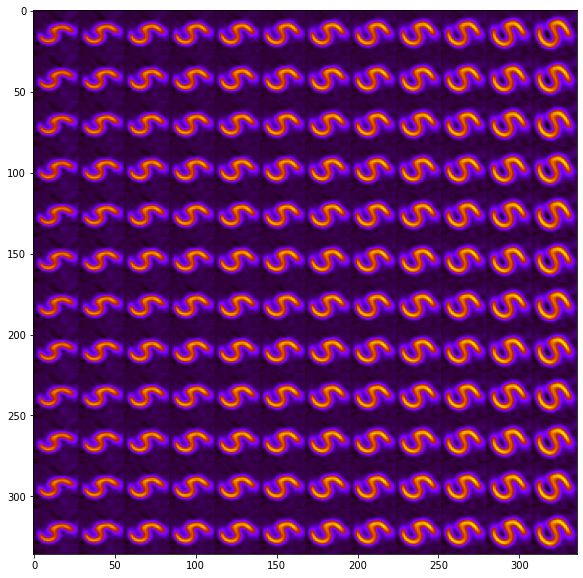

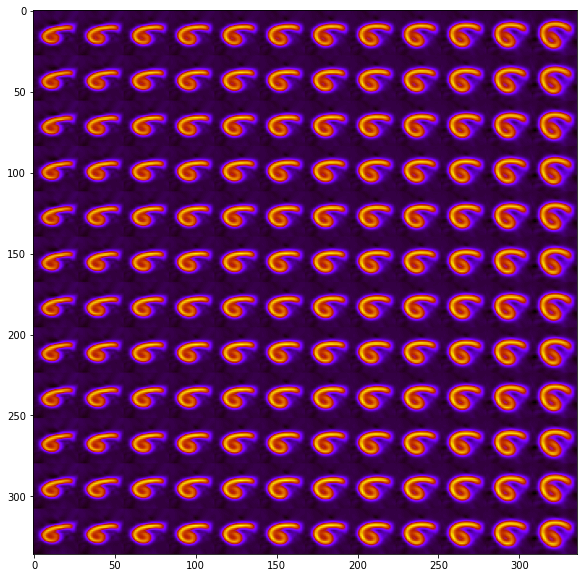

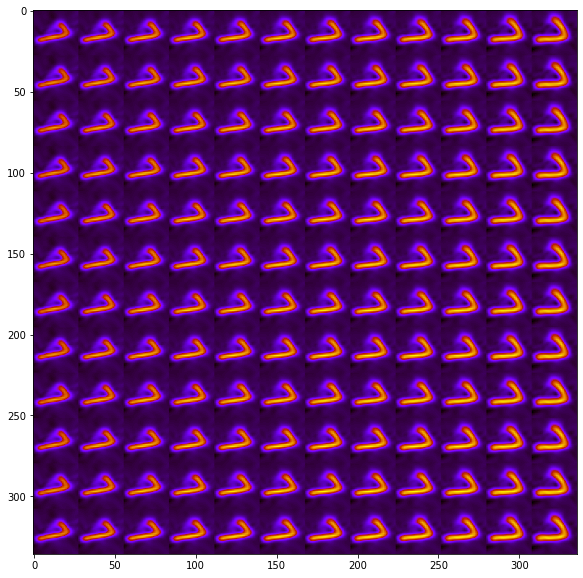

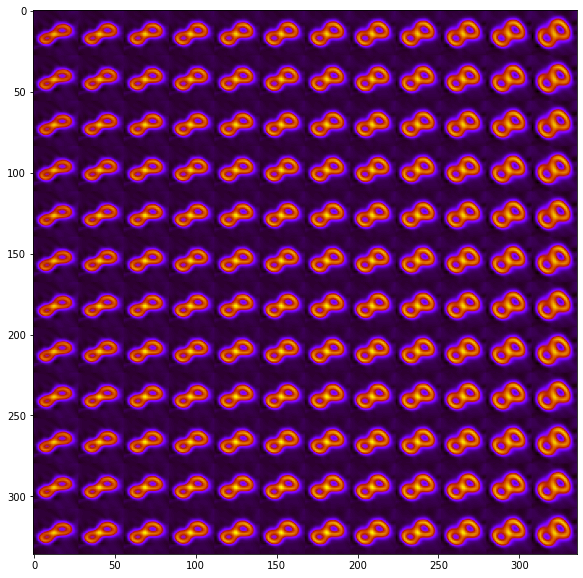

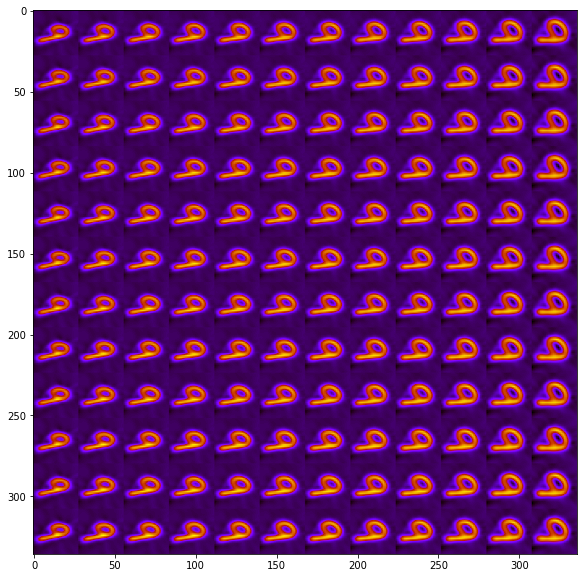

In [ ]:
for i in range(10):
    rvae.manifold2d(label=i, d=12, origin="upper")

Finally, we can run a regular VAE with class conditioning to confirm that it does *not* work (as one would expect):

In [ ]:
input_dim = (28, 28)

# Intitialize model
vae = aoi.models.VAE(input_dim, nb_classes=10) 
# Train
vae.fit(imstack_train, labels_train, training_cycles=100, batch_size=100)

Epoch: 1/100, Training loss: 28.0938
Epoch: 2/100, Training loss: 24.3138
Epoch: 3/100, Training loss: 23.9102
Epoch: 4/100, Training loss: 23.8576
Epoch: 5/100, Training loss: 23.8321
Epoch: 6/100, Training loss: 23.8036
Epoch: 7/100, Training loss: 23.3527
Epoch: 8/100, Training loss: 23.1127
Epoch: 9/100, Training loss: 23.0627
Epoch: 10/100, Training loss: 22.9814
Epoch: 11/100, Training loss: 22.8937
Epoch: 12/100, Training loss: 22.7381
Epoch: 13/100, Training loss: 22.5680
Epoch: 14/100, Training loss: 22.3847
Epoch: 15/100, Training loss: 22.2219
Epoch: 16/100, Training loss: 22.0643
Epoch: 17/100, Training loss: 21.9494
Epoch: 18/100, Training loss: 21.8494
Epoch: 19/100, Training loss: 21.7576
Epoch: 20/100, Training loss: 21.6723
Epoch: 21/100, Training loss: 21.5964
Epoch: 22/100, Training loss: 21.5354
Epoch: 23/100, Training loss: 21.4711
Epoch: 24/100, Training loss: 21.4081
Epoch: 25/100, Training loss: 21.3441
Epoch: 26/100, Training loss: 21.2828
Epoch: 27/100, Traini

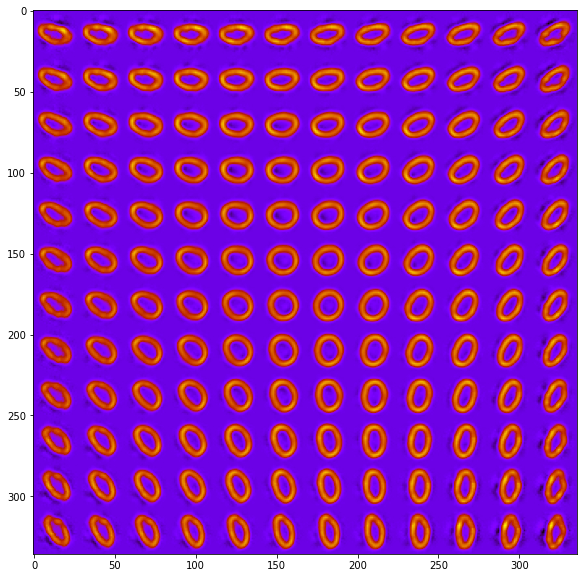

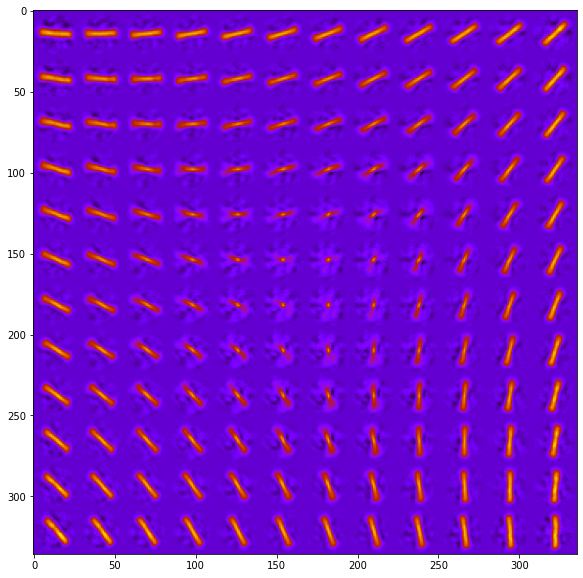

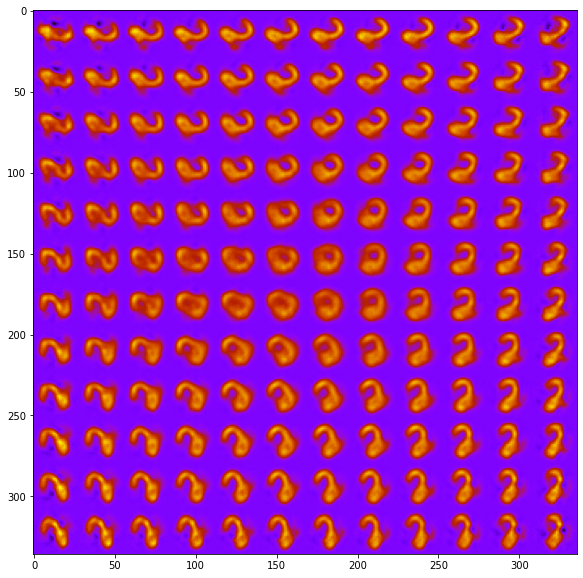

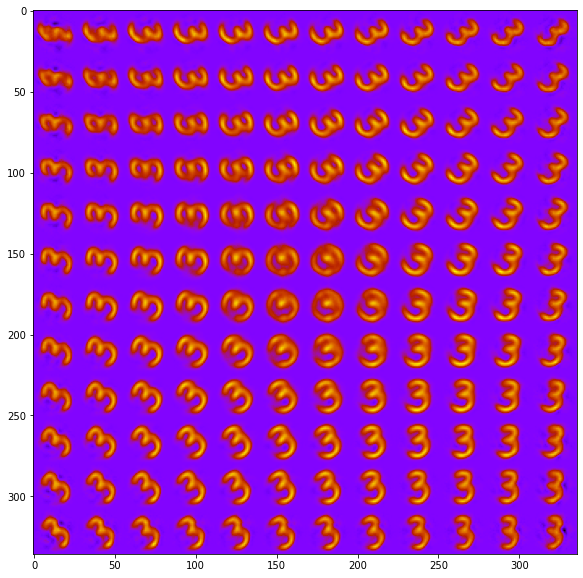

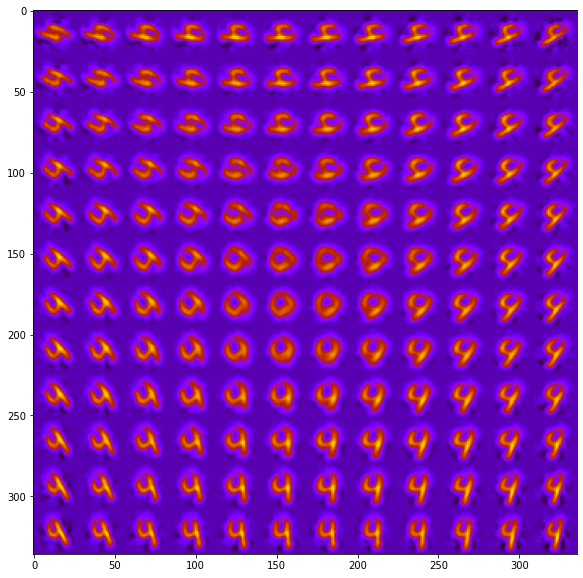

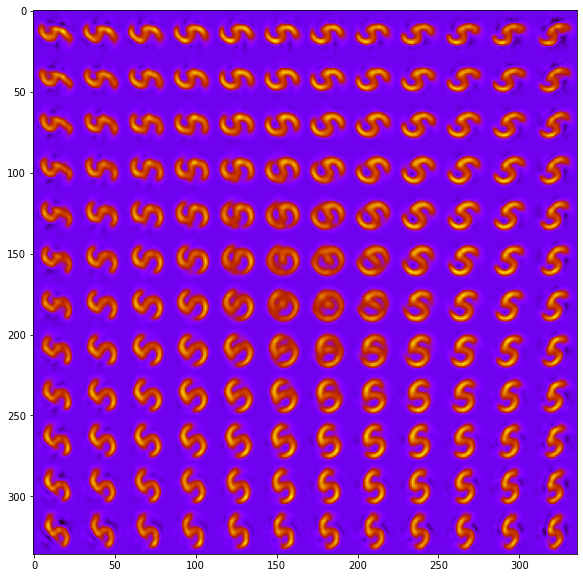

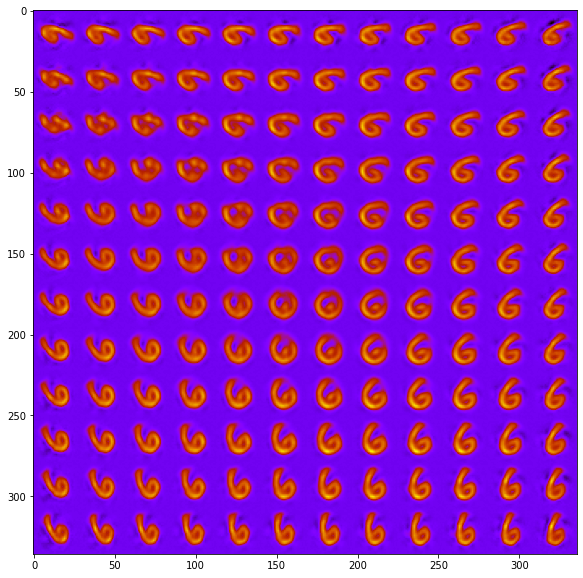

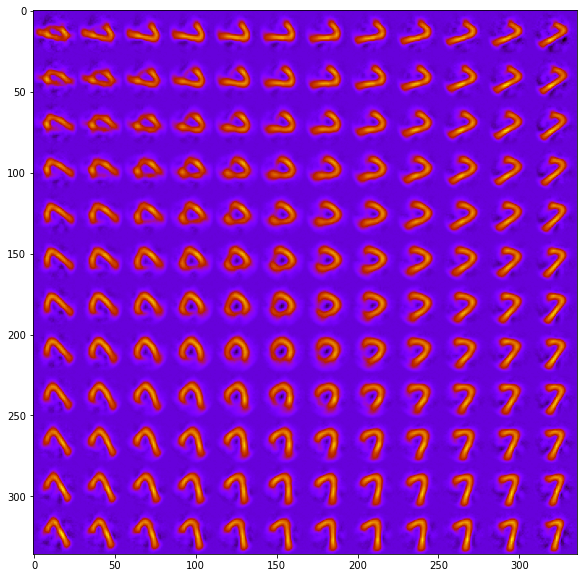

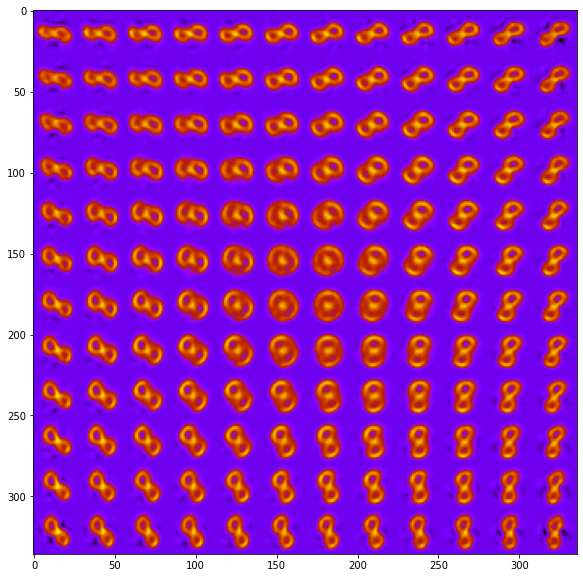

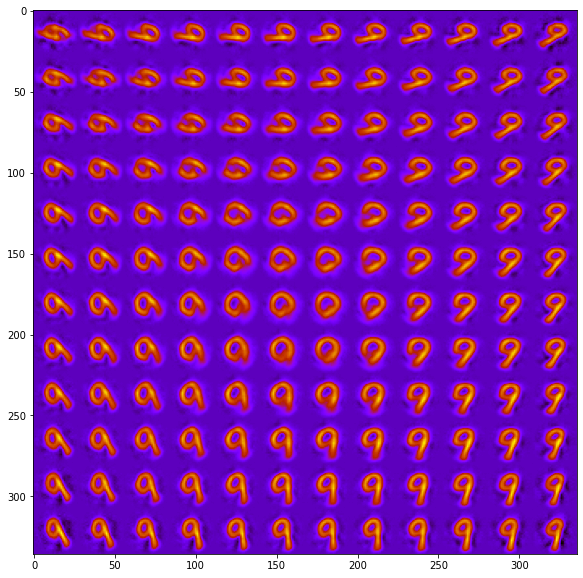

In [ ]:
for i in range(10):
    vae.manifold2d(label=i, d=12, origin="upper")